# **Federated Creditcard Fraud Detection**

Dataset: https://www.kaggle.com/c/porto-seguro-safe-driver-prediction

## Download data

Install Kaggle and create token

In [9]:
!pip install --quiet kaggle
!mkdir /root/.kaggle

import json
token = {'username':'leosole','key':'e40435053fa4956ef644049dee417de2'}
with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(token, file)

!chmod 600 /root/.kaggle/kaggle.json
!kaggle config set -n path -v /content 
!kaggle competitions download -c porto-seguro-safe-driver-prediction
!unzip -n /content/competitions/porto-seguro-safe-driver-prediction/train.csv.zip
!rm /content/competitions/porto-seguro-safe-driver-prediction/train.csv.zip
!rm /content/competitions/porto-seguro-safe-driver-prediction/test.csv.zip

mkdir: cannot create directory ‘/root/.kaggle’: File exists
- path is now set to: /content
 74% 33.0M/44.4M [00:00<00:00, 24.1MB/s]
100% 44.4M/44.4M [00:00<00:00, 53.8MB/s]
 93% 28.0M/30.0M [00:00<00:00, 111MB/s] 
100% 30.0M/30.0M [00:00<00:00, 146MB/s]
sample_submission.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  /content/competitions/porto-seguro-safe-driver-prediction/train.csv.zip
  inflating: train.csv               


Download dataset

Import libraries

In [10]:
!pip uninstall --yes tensorboard tb-nightly
!pip install --quiet --upgrade tensorflow-federated-nightly tfa-nightly nest-asyncio 
# !pip install --quiet --upgrade tensorflow-addons
# !pip install --quiet --upgrade nest-asyncio
# !pip install --quiet --upgrade tb-nightly
import nest_asyncio
nest_asyncio.apply()

Uninstalling tb-nightly-2.6.0a20210519:
  Successfully uninstalled tb-nightly-2.6.0a20210519


## Read Data  and set parameters

In [11]:
import collections
import numpy as np
import tensorflow as tf
import tensorflow_federated as tff
import pandas as pd
import math
from math import sqrt
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow.keras as keras
import datetime

from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import optimizers

import tensorflow_addons as tfa

from sklearn.model_selection import train_test_split

from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

np.random.seed(0)


In [12]:
%load_ext tensorboard
!rm -r logs/fit

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
rm: cannot remove 'logs/fit': No such file or directory


Read dataset

In [13]:
random_state = 1
df = pd.read_csv('/content/train.csv')
!rm /content/train.csv
df = df.sample(frac=1, random_state=random_state )
df.shape

(595212, 59)

In [14]:
for c in df.columns:
  df = df[df[c] != -1]
df.shape


(124931, 59)

In [15]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

def resample(x, y):
    over = SMOTE(sampling_strategy=0.7)
    under = RandomUnderSampler(sampling_strategy=1)
    steps = [
            ('o', over), 
            #  ('u', under)
            ]
    pipeline = Pipeline(steps=steps)
    x_new, y_new = pipeline.fit_resample(x, y)
    return x_new, y_new

Define loss function

Split into training and testing

In [16]:
y = df.target.to_numpy()
x = df.drop(columns = ['target'])
x = x.iloc[:,:].to_numpy()
x_train, x_test, y_train, y_test = train_test_split(
    x,
    y,
    test_size = 0.3,
    shuffle= True,
    stratify=y,
    random_state=random_state
    )

In [17]:
counts = np.bincount(y_train[:])
print(f"Number of positive samples in training data: {counts[1]} ({100 * float(counts[1]) / len(y_train):.2f}% of total)")
counts2 = np.bincount(y_test[:])
print(f"Number of positive samples in test data: {counts2[1]} ({100 * float(counts2[1]) / len(y_test):.2f}% of total)")

Number of positive samples in training data: 3969 (4.54% of total)
Number of positive samples in test data: 1701 (4.54% of total)


Parameters

In [18]:
total_clients = 3
client_lr = 1e-3
server_lr = 1e-1
NUM_ROUNDS = 200
NUM_EPOCHS = 5
BATCH_SIZE = 2048
TH = 0.5

Scale parameters

In [19]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
x_train = scaler.fit_transform(x_train)
# x_train_r, y_train_r = resample(x_train, y_train)
x_test = scaler.transform(x_test)
x_val, x_test, y_val, y_test = train_test_split(
    x_test, y_test,
    test_size = 0.7,
    shuffle= True,
    stratify=y_test,
    random_state=random_state
    )


Define base model

In [20]:
def base_model():
  return Sequential([
        Dense(256, activation='relu', input_shape=(x_train.shape[-1],)),
        # keras.layers.BatchNormalization(),
        Dropout(0.5),
        Dense(256, activation='relu'),
        # keras.layers.BatchNormalization(),
        Dropout(0.5),
        Dense(256, activation='relu'),
        # keras.layers.BatchNormalization(),
        Dropout(0.5),
        Dense(1, activation='sigmoid'),
    ])



## Federated Learning

Separate data into clients and resample data according to each clients samples

In [21]:
from collections import Counter

# scaler = RobustScaler()
# x_train = scaler.fit_transform(x_train)
# x_test = scaler.transform(x_test)
total_samples = len(x_train)
samples_per_set = int(np.floor(total_samples/total_clients))

df = df.sample(frac=1, random_state=random_state )


client_train_dataset = collections.OrderedDict()
for i in range(1, total_clients+1):
  client_name = "client_" + str(i)
  start = samples_per_set * (i-1)
  end = samples_per_set * i
  print(f"Adding data from {start} to {end} for client : {client_name}")
  data = collections.OrderedDict((('y', y_train[start:end]), ('x', x_train[start:end])))
  client_train_dataset[client_name] = data
  counts = np.bincount(y_train[start:end])
  if len(counts) > 1: 
    print(f"Number of positive samples in {client_name} data: {counts[1]} ({100 * float(counts[1]) / len(y_train[start:end]):.2f}% of total)")
  else:
    print(f'No positive samples in {client_name} data')
train_dataset = tff.simulation.datasets.TestClientData(client_train_dataset)

Adding data from 0 to 29150 for client : client_1
Number of positive samples in client_1 data: 1334 (4.58% of total)
Adding data from 29150 to 58300 for client : client_2
Number of positive samples in client_2 data: 1330 (4.56% of total)
Adding data from 58300 to 87450 for client : client_3
Number of positive samples in client_3 data: 1305 (4.48% of total)


In [22]:
# total_samples_r = len(x_train_r)
# samples_per_set_r = int(np.floor(total_samples_r/total_clients))

client_train_dataset_r = collections.OrderedDict()
for i in range(1, total_clients+1):
  client_name = "client_" + str(i)
  start = samples_per_set * (i-1)
  end = samples_per_set * i
  x_train_r, y_train_r = resample(x_train[start:end], y_train[start:end])
  print(f"Adding data from {start} to {end} for client : {client_name}")
  data = collections.OrderedDict((('y', y_train_r), ('x', x_train_r)))
  client_train_dataset_r[client_name] = data
  counts = np.bincount(y_train_r)
  if len(counts) > 1: 
    print(f"Number of positive samples in {client_name} data: {counts[1]} ({100 * float(counts[1]) / len(y_train_r):.2f}% of total)")
  else:
    print(f'No positive samples in {client_name} data')
train_dataset_r = tff.simulation.datasets.TestClientData(client_train_dataset_r)

Adding data from 0 to 29150 for client : client_1
Number of positive samples in client_1 data: 19471 (41.18% of total)
Adding data from 29150 to 58300 for client : client_2
Number of positive samples in client_2 data: 19474 (41.18% of total)
Adding data from 58300 to 87450 for client : client_3
Number of positive samples in client_3 data: 19491 (41.18% of total)


In [23]:

sample_dataset = train_dataset.create_tf_dataset_for_client(train_dataset.client_ids[0])
sample_element = next(iter(sample_dataset))
PREFETCH_BUFFER = 10
SHUFFLE_BUFFER = samples_per_set

def preprocess(dataset):

  def batch_format_fn(element):
    return collections.OrderedDict(
        x=element['x'],
        y=tf.reshape(element['y'], [-1, 1]))

  return dataset.repeat(NUM_EPOCHS).shuffle(SHUFFLE_BUFFER).batch(BATCH_SIZE).map(batch_format_fn).prefetch(PREFETCH_BUFFER)

preprocessed_sample_dataset = preprocess(sample_dataset)
sample_batch = tf.nest.map_structure(lambda x: x.numpy(), next(iter(preprocessed_sample_dataset)))

def make_federated_data(client_data, client_ids):
    return [preprocess(client_data.create_tf_dataset_for_client(x)) for x in client_ids]

federated_train_data = make_federated_data(train_dataset, train_dataset.client_ids)

print('Number of client datasets: {l}'.format(l=len(federated_train_data)))


Number of client datasets: 3


In [24]:
sample_dataset_r = train_dataset_r.create_tf_dataset_for_client(train_dataset_r.client_ids[0])
sample_element_r = next(iter(sample_dataset_r))
PREFETCH_BUFFER = 10
SHUFFLE_BUFFER = samples_per_set

preprocessed_sample_dataset_r = preprocess(sample_dataset_r)
sample_batch_r = tf.nest.map_structure(lambda x: x.numpy(), next(iter(preprocessed_sample_dataset_r)))

federated_train_data_r = make_federated_data(train_dataset_r, train_dataset_r.client_ids)

print('Number of client datasets: {l}'.format(l=len(federated_train_data_r)))

Number of client datasets: 3


Create federated model

In [25]:
def model_tff():
  model = base_model()
  return tff.learning.from_keras_model(
      model,
      input_spec=preprocessed_sample_dataset.element_spec,
      loss=tf.keras.losses.BinaryCrossentropy(),
      metrics=[
               tfa.metrics.F1Score(num_classes=1, threshold=TH),
               keras.metrics.Precision(name="precision", thresholds=TH),
               keras.metrics.Recall(name="recall", thresholds=TH)
              ])

In [26]:
iterative_process = tff.learning.build_federated_averaging_process(
    model_tff,
    client_optimizer_fn=lambda: optimizers.Adam(learning_rate=client_lr),
    server_optimizer_fn=lambda: optimizers.SGD(learning_rate=server_lr))


Run federated simulations

In [27]:
# evaluation_process = tff.learning.build_federated_evaluation(model_tff)
state = iterative_process.initialize()
log_dir = "logs/fit/federated-" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

%tensorboard --logdir logs/fit

summary_writer_train = tf.summary.create_file_writer(log_dir+'/train')
summary_writer_val = tf.summary.create_file_writer(log_dir+'/val')

federated_model = None

for round_num in range(1, NUM_ROUNDS+1):
    state, tff_metrics = iterative_process.next(state, federated_train_data)
    federated_model = base_model()
    federated_model.compile(optimizer=optimizers.Adam(learning_rate=client_lr),
                        loss=tf.keras.losses.BinaryCrossentropy(),
                        metrics=[
                              tfa.metrics.F1Score(num_classes=1, threshold=TH),
                              keras.metrics.Precision(name="precision", thresholds=TH),
                              keras.metrics.Recall(name="recall", thresholds=TH)
                              ])
    state.model.assign_weights_to(model=federated_model)
    federated_result = federated_model.evaluate(x_val, y_val, verbose=0, return_dict=True)
    with summary_writer_train.as_default():
      for name, metric in tff_metrics['train'].items():
        if name=='f1_score':
          tf.summary.scalar(name, metric[0], round_num)
        else:
          tf.summary.scalar(name, metric, round_num)
    with summary_writer_val.as_default():
      for name, metric in federated_result.items():
        if name=='f1_score':
          tf.summary.scalar(name, metric[0], round_num)
        else:
          tf.summary.scalar(name, metric, round_num)    

federated_test = federated_model.evaluate(x_test, y_test, verbose=0, return_dict=True)


Output hidden; open in https://colab.research.google.com to view.

In [28]:
state = iterative_process.initialize()
log_dir = "logs/fit/resampled-" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

summary_writer_train = tf.summary.create_file_writer(log_dir+'/train_r')
summary_writer_val = tf.summary.create_file_writer(log_dir+'/val_r')

resampled_model = None

for round_num in range(1, NUM_ROUNDS+1):
    state, tff_metrics_r = iterative_process.next(state, federated_train_data_r)
    resampled_model = base_model()
    resampled_model.compile(optimizer=optimizers.Adam(learning_rate=client_lr),
                        loss=tf.keras.losses.BinaryCrossentropy(),
                        metrics=[
                              tfa.metrics.F1Score(num_classes=1, threshold=TH),
                              keras.metrics.Precision(name="precision", thresholds=TH),
                              keras.metrics.Recall(name="recall", thresholds=TH)
                              ])
    state.model.assign_weights_to(model=resampled_model)
    resampled_result = resampled_model.evaluate(x_val, y_val, verbose=0, return_dict=True)
    with summary_writer_train.as_default():
      for name, metric in tff_metrics_r['train'].items():
        if name=='f1_score':
          tf.summary.scalar(name, metric[0], round_num)
        else:
          tf.summary.scalar(name, metric, round_num)
    with summary_writer_val.as_default():
      for name, metric in resampled_result.items():
        if name=='f1_score':
          tf.summary.scalar(name, metric[0], round_num)
        else:
          tf.summary.scalar(name, metric, round_num)    

resampled_test = resampled_model.evaluate(x_test, y_test, verbose=0, return_dict=True)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:251: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


In [29]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow import greater
import seaborn as sns
from matplotlib.colors import LogNorm

y_pred = federated_model.predict(x_test)
y_pb_f = greater(y_pred, TH)

y_pred_r = resampled_model.predict(x_test)
y_pb_r = greater(y_pred_r, TH)


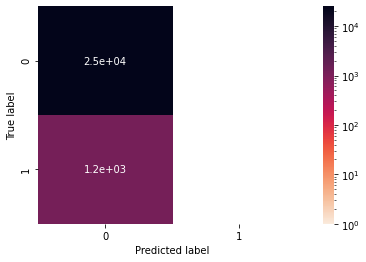

Train -> Loss: 0.16135 | F1-Score: 0.00000 | Precision: 0.00000 | Recall: 0.00000
Val   -> Loss: 0.24176 | F1-Score: 0.00000 | Precision: 0.00000 | Recall: 0.00000
Test  -> Loss: 0.24224 | F1-Score: 0.00000 | Precision: 0.00000 | Recall: 0.00000


In [30]:

cm_f = confusion_matrix(y_test, y_pb_f)
sns.heatmap(cm_f, cmap='rocket_r', annot=True, norm=LogNorm(vmin=1, vmax=cm_f.max()))
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()
print(f"Train -> Loss: {tff_metrics['train']['loss']:.5f} | F1-Score: {tff_metrics['train']['f1_score'][0]:.5f} | Precision: {tff_metrics['train']['precision']:.5f} | Recall: {tff_metrics['train']['recall']:.5f}")
print(f"Val   -> Loss: {federated_result['loss']:.5f} | F1-Score: {federated_result['f1_score'][0]:.5f} | Precision: {federated_result['precision']:.5f} | Recall: {federated_result['recall']:.5f}")
print(f"Test  -> Loss: {federated_test['loss']:.5f} | F1-Score: {federated_test['f1_score'][0]:.5f} | Precision: {federated_test['precision']:.5f} | Recall: {federated_test['recall']:.5f}")


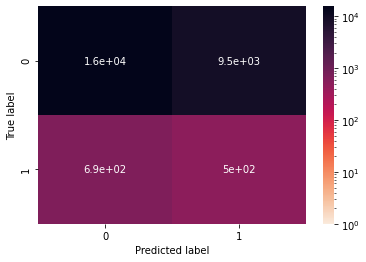

Train -> Loss: 0.20708 | F1-Score: 0.90220 | Precision: 0.89695 | Recall: 0.90751
Val   -> Loss: 0.84983 | F1-Score: 0.08671 | Precision: 0.04845 | Recall: 0.41176
Test  -> Loss: 0.83982 | F1-Score: 0.08983 | Precision: 0.05026 | Recall: 0.42233


In [31]:

cm_r = confusion_matrix(y_test, y_pb_r)
sns.heatmap(cm_r, cmap='rocket_r', annot=True, norm=LogNorm(vmin=1, vmax=cm_r.max()))
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()
print(f"Train -> Loss: {tff_metrics_r['train']['loss']:.5f} | F1-Score: {tff_metrics_r['train']['f1_score'][0]:.5f} | Precision: {tff_metrics_r['train']['precision']:.5f} | Recall: {tff_metrics_r['train']['recall']:.5f}")
print(f"Val   -> Loss: {resampled_result['loss']:.5f} | F1-Score: {resampled_result['f1_score'][0]:.5f} | Precision: {resampled_result['precision']:.5f} | Recall: {resampled_result['recall']:.5f}")
print(f"Test  -> Loss: {resampled_test['loss']:.5f} | F1-Score: {resampled_test['f1_score'][0]:.5f} | Precision: {resampled_test['precision']:.5f} | Recall: {resampled_test['recall']:.5f}")
